# 第三次作业：基于 RTMDet 的气球检测

In [4]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet


def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

/home/shiyiming/anaconda3/envs/mm2/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


sys.platform: linux
Python: 3.9.16 (main, Mar  8 2023, 14:00:05) [GCC 11.2.0]
CUDA available: True
numpy_random_seed: 2147483648
GPU 0,1,2,3: Quadro RTX 6000
CUDA_HOME: None
GCC: gcc (Ubuntu 11.3.0-1ubuntu1~22.04) 11.3.0
PyTorch: 1.12.1
PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2021.4-Product Build 20210904 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_61,code=sm_61;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute_80,code=sm_80;-gencode;arch=compute_86,code=sm_86;-g

## 可视化数据集和标签

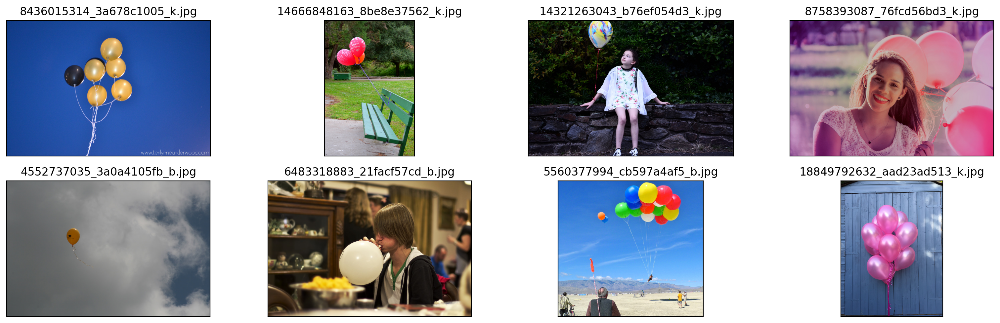

In [5]:
import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

image_path = [filename for filename in os.listdir('/home/shiyiming/data/balloon/train')][:8]

for idx, filename in enumerate(image_path):
    name = os.path.splitext(filename)[0]

    image = Image.open('/home/shiyiming/data/balloon/train/'+filename).convert("RGB")

    plt.subplot(2, 4, idx+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


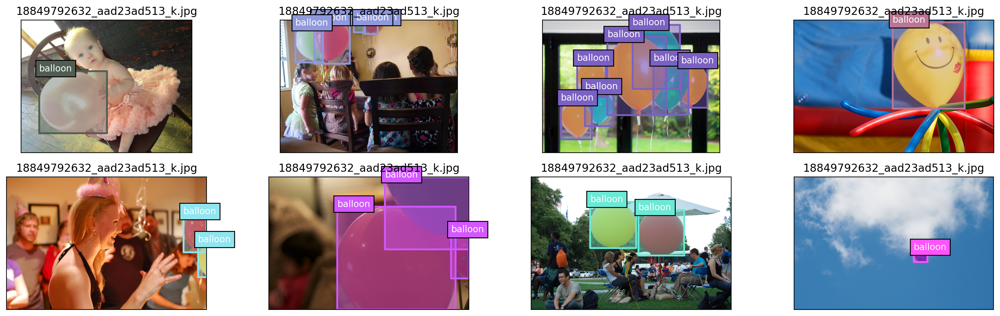

In [6]:
from pycocotools.coco import COCO
import numpy as np
import os.path as osp
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon

def apply_exif_orientation(image):
    _EXIF_ORIENT = 274
    if not hasattr(image, 'getexif'):
        return image
    
    try:
        exif = image.getexif()
    except Exception:
        exif = None

    if exif is None:
        return image
    
    orientation = exif.get(_EXIF_ORIENT)

    method = {
        2: Image.FLIP_LEFT_RIGHT,
        3: Image.ROTATE_180,
        4: Image.FLIP_TOP_BOTTOM,
        5: Image.TRANSPOSE,
        6: Image.ROTATE_270,
        7: Image.TRANSVERSE,
        8: Image.ROTATE_90,
    }.get(orientation)
    if method is not None:
        return image.transpose(method)
    return image

def show_bbox_only(coco, anns, show_label_bbox=True, is_filling=True):
    if len(anns) == 0:
        return
    
    ax = plt.gca()
    ax.set_autoscale_on(False)

    image2color = dict()
    for cat in coco.getCatIds():
        image2color[cat] = (np.random.random((1, 3)) * 0.7 + 0.3).tolist()[0]

    polygons = []
    colors = []

    for ann in anns:
        color = image2color[ann['category_id']]
        bbox_x, bbox_y, bbox_w, bbox_h = ann['bbox']
        poly = [[bbox_x, bbox_y], [bbox_x, bbox_y + bbox_h],
                [bbox_x + bbox_w, bbox_y + bbox_h], [bbox_x + bbox_w, bbox_y]]
        polygons.append(Polygon(np.array(poly).reshape((4, 2))))
        colors.append(color)

        if show_label_bbox:
            label_bbox = dict(facecolor=color)
        else:
            label_bbox = None

        ax.text(
            bbox_x,
            bbox_y,
            '%s' % (coco.loadCats(ann['category_id'])[0]['name']),
            color='white',
            bbox=label_bbox,
        )
    
    if is_filling:
        p = PatchCollection(polygons, facecolor=colors, linewidths=0, alpha=0.4)
        ax.add_collection(p)
    p = PatchCollection(polygons, facecolor='none', edgecolors=colors, linewidths=2)
    ax.add_collection(p)

coco = COCO('/home/shiyiming/data/balloon/train.json')
image_ids = coco.getImgIds()
np.random.shuffle(image_ids)

plt.figure(figsize=(16, 5))

for idx in range(8):
    image_data = coco.loadImgs(image_ids[idx])[0]
    image_path = osp.join('/home/shiyiming/data/balloon/train', image_data['file_name'])
    annotation_ids = coco.getAnnIds(imgIds=image_data['id'], catIds=[], iscrowd=0)
    annotations = coco.loadAnns(annotation_ids)

    ax = plt.subplot(2, 4, idx+1)
    image = Image.open(image_path).convert("RGB")

    image = apply_exif_orientation(image)

    ax.imshow(image)

    show_bbox_only(coco, annotations)

    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

## 训练前可视化验证

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
06/10 15:50:53 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


/home/shiyiming/mmengine/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/home/shiyiming/mmengine/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(


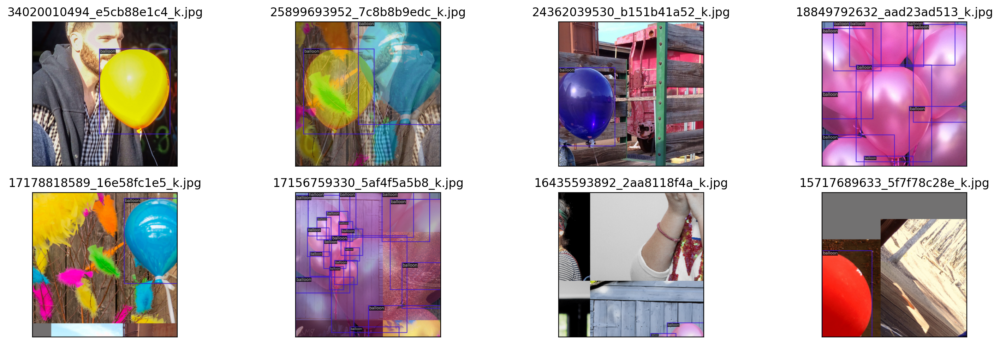

In [7]:
from mmdet.registry import DATASETS, VISUALIZERS
from mmengine.config import Config
from mmengine.registry import init_default_scope

cfg = Config.fromfile('/home/shiyiming/projects/mmdetection/configs/rtmdet_tiny_8xb32-300e_coco.py')

init_default_scope(cfg.get('default_scope', 'mmdet'))

dataset = DATASETS.build(cfg.train_dataloader.dataset)
visualizer = VISUALIZERS.build(cfg.visualizer)
visualizer.dataset_meta = dataset.metainfo

plt.figure(figsize=(16, 5))

for idx in range(8):
    item = dataset[idx]

    img = item['inputs'].permute(1, 2, 0).numpy()
    data_sample = item['data_samples'].numpy()
    gt_instances = data_sample.gt_instances
    img_path = osp.basename(item['data_samples'].img_path)

    gt_bboxes = gt_instances.get('bboxes', None)
    gt_instances.bboxes = gt_bboxes.tensor
    data_sample.gt_instances = gt_instances

    visualizer.add_datasample(
        osp.basename(img_path),
        img,
        data_sample,
        draw_pred=False,
        show=False,
    )
    drawed_image = visualizer.get_image()

    plt.subplot(2, 4, idx+1)
    plt.imshow(drawed_image[..., [2, 1, 0]])
    plt.title(f"{osp.basename(img_path)}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

## 训练 & 测试

```bash
# 训练模型
CUDA_VISIBLE_DEVICES=2 mim train mmdet configs/rtmdet_tiny_8xb32-300e_coco.py --work-dir=./work_dirs/rtmdet_tiny

# 测试模型
CUDA_VISIBLE_DEVICES=2 mim test mmdet configs/rtmdet_tiny_8xb32-300e_coco.py --checkpoint work_dirs/rtmdet_tiny/epoch_20.pth --work-dir work_dirs/rtmdet_tiny --show-dir results

# 测试结果
# coco/bbox_mAP: 0.6540  coco/bbox_mAP_50: 0.8160  coco/bbox_mAP_75: 0.7740  coco/bbox_mAP_s: 0.0000  coco/bbox_mAP_m: 0.3790  coco/bbox_mAP_l: 0.7770  data_time: 0.1571  time: 0.7835

## 推理

In [8]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = 'configs/rtmdet_tiny_8xb32-300e_coco.py'
# Setup a checkpoint file to load
checkpoint = glob.glob('./work_dirs/rtmdet_tiny/best_coco*.pth')[0]

# Set the device to be used for evaluation
device = 'cuda:2'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

# Use the detector to do inference
img = 'balloon.jpg'
result = inferencer(img, out_dir='./outputs')

Loads checkpoint by local backend from path: ./work_dirs/rtmdet_tiny/best_coco_bbox_mAP_epoch_19.pth
06/10 15:50:59 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.


/home/shiyiming/anaconda3/envs/mm2/lib/python3.9/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/shiyiming/anaconda3/envs/mm2/lib/python3.9/site-packages/torch/functional.py:478: UserWarning: 
torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at
/opt/conda/conda-bld/pytorch_1659484809662/work/aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

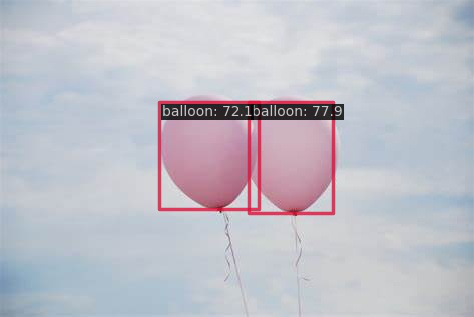

In [9]:
Image.open('/home/shiyiming/projects/mmdetection/output/vis/balloon.jpg')

## 可视化分析

In [10]:
import cv2

img = cv2.imread('/home/shiyiming/projects/mmdetection/balloon.jpg')
h, w = img.shape[:2]
resized_img = cv2.resize(img, (640, 640))
cv2.imwrite('resized_image.jpg', resized_img)

True

```bash
CUDA_VISIBLE_DEVICES=2 python /home/shiyiming/mm2/mmyolo/demo/featmap_vis_demo.py \
    resized_image.jpg configs/rtmdet_tiny_8xb32-300e_coco.py \
    work_dirs/rtmdet_tiny/best_coco_bbox_mAP_epoch_19.pth \
    --target-layers backbone \
    --channel-reduction squeeze_mean

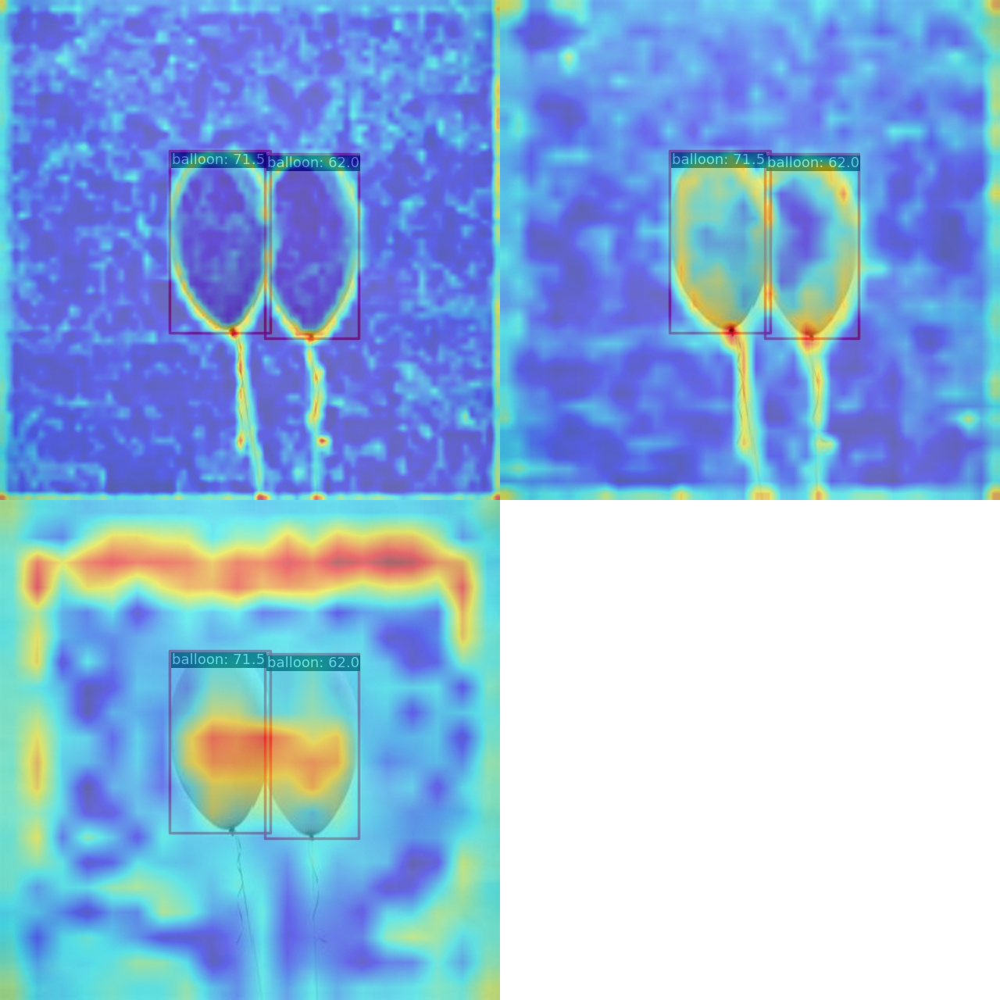

In [12]:
Image.open('output/resized_image_backbone.jpg')

```bash
CUDA_VISIBLE_DEVICES=2 python /home/shiyiming/mm2/mmyolo/demo/featmap_vis_demo.py \
    resized_image.jpg configs/rtmdet_tiny_8xb32-300e_coco.py \
    work_dirs/rtmdet_tiny/best_coco_bbox_mAP_epoch_19.pth \
    --target-layers neck \
    --channel-reduction squeeze_mean

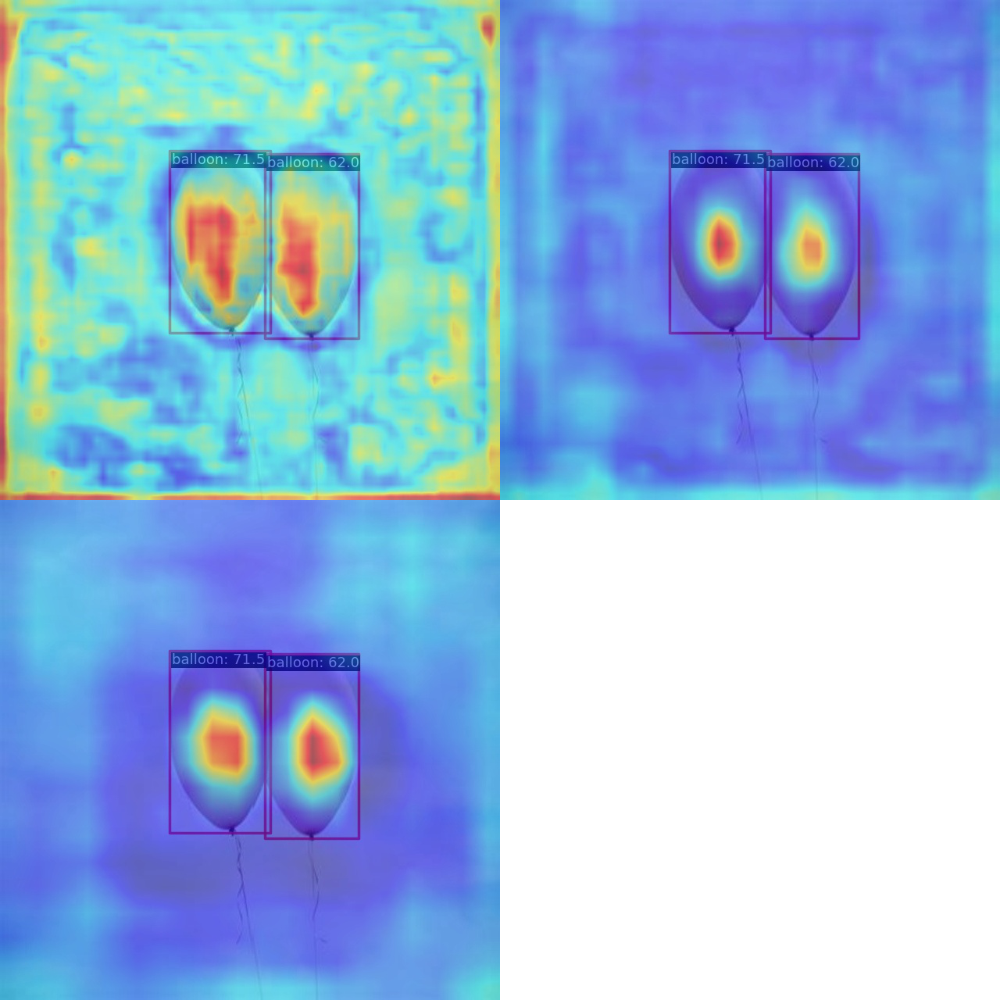

In [13]:
Image.open('output/resized_image_neck.jpg')